In [5]:
conda install -c conda-forge wordcloud

Solving environment: ...working... done

# All requested packages already installed.

Retrieving notices: ...working... done

Note: you may need to restart the kernel to use updated packages.


In [6]:
import csv
import json
import pandas as pd
import re
import nltk
nltk.download('punkt')
nltk.download('stopwords')
from nltk.corpus import stopwords
from nltk.stem import SnowballStemmer 
from nltk.stem import WordNetLemmatizer
nltk.download('wordnet')
import string
import pickle
import collections
from wordcloud import WordCloud
import matplotlib.pyplot as plt

lmtz = WordNetLemmatizer()

[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\boom-\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\boom-\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\boom-\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


In [13]:
import os
os.getcwd()

'C:\\Users\\boom-\\Documents\\GitHub\\stat628-module3-group4-fall2022-uwmadison\\code'

In [15]:
bars_review = pd.read_csv("../data/bars_list_ca.csv").drop(columns=['Unnamed: 0'])

In [52]:
bars_review.nunique()

business_id       163
stars_x             5
text            44606
name              163
address           134
city                5
state               1
postal_code         9
latitude          153
longitude         154
stars_y             7
review_count      140
is_open             2
attributes        162
hours             149
dtype: int64

In [17]:
# Define a function for NLP

def txt_process(text):
    # 1. Deal with not ... case
    ## 1.1 some word include contractions (n't, 'll, 're)
    new_text = re.sub(r'won\'t', 'will not', text)
    new_text = re.sub(r'n\'t', ' not', new_text)
    new_text = re.sub(r'\'ll', ' will', new_text)
    new_text = re.sub(r'\'m', ' am', new_text)
    ## 1.2 take not ... case into account
    new_text = re.sub(r'not ', 'not_', new_text)
    
    # 2. Tokenize the sentence into words (also remove puncutation except "_" and lowercase)
    word_split = nltk.word_tokenize(new_text.lower().translate(str.maketrans('', '', string.punctuation.replace("_",""))))
    
    # 3. Remove stopwords
    stops = set(stopwords.words('english'))
    review_word = [word for word in word_split if word not in stops]
    
    """# 4. Stemming words
    sb_stemmer = SnowballStemmer("english",)
    review_stem_word = []
    for word in review_word:
        stemmer = sb_stemmer.stem(word)
        review_stem_word.append(stemmer)"""
    review_lemmatized_word = [lmtz.lemmatize(word) for word in review_word]
        
    return review_lemmatized_word

In [18]:
txt_process(bars_review["text"][9])

['love',
 'place',
 'best',
 'view',
 'santa',
 'barbara',
 'awesome',
 'wine',
 'wife',
 'industry',
 'always',
 'treated',
 'great',
 'tom',
 'gillian',
 'always',
 'generous',
 'host',
 'wife',
 'work',
 'carrwinery',
 'always',
 'refers',
 'customer',
 'conway',
 'cab',
 'best',
 'sb',
 'offer',
 'one',
 'tasting',
 'room',
 'employee',
 'gifted',
 'u',
 'conway',
 '13',
 'reserve',
 'syrah',
 'beautiful',
 'thank',
 'tommy',
 'rolos',
 'red',
 'bottle',
 'wine',
 'snob',
 'would',
 'love',
 'great',
 'bottle',
 'finding',
 'pallet',
 'well',
 'son',
 '5',
 'always',
 'want',
 'mom',
 'dad',
 'go',
 'wine',
 'tasting',
 'hit',
 'pier',
 'never',
 'disappointed']

In [19]:
# Create the data for review for each star

rating = list(bars_review["stars_x"])
word_1_star = []
word_2_star = []
word_3_star = []
word_4_star = []
word_5_star = []
review_word_list = []

for i in range(len(bars_review)):
    #rating.append(bars_review["stars_x"][i])
    review_word_i = txt_process(bars_review["text"][i])
    review_word_list.append(review_word_i)
    
    # check how many stars do they receive
    if bars_review["stars_x"][i] == 1.0:
        word_1_star.append(review_word_i)
        
    if bars_review["stars_x"][i] == 2.0:
        word_2_star.append(review_word_i)
     
    if bars_review["stars_x"][i] == 3.0:
        word_3_star.append(review_word_i) 
        
    if bars_review["stars_x"][i] == 4.0:
        word_4_star.append(review_word_i)
        
    if bars_review["stars_x"][i] == 5.0:
        word_5_star.append(review_word_i)

# Delete some too broad words
useless_words = ("food", "place", "restaurant", "time", "really", "would", "us", "also", "definitely","like","could"
                ,"get","went","thing","good","great","u")
review_useful_word_list = [word for review in review_word_list for word in review if word not in useless_words]
word_1_star = [word for i in word_1_star for word in i if word not in useless_words]
word_2_star = [word for i in word_2_star for word in i if word not in useless_words]
word_3_star = [word for i in word_3_star for word in i if word not in useless_words]
word_4_star = [word for i in word_4_star for word in i if word not in useless_words]
word_5_star = [word for i in word_5_star for word in i if word not in useless_words]

In [20]:
review_useful_word_list

['bit',
 'weary',
 'trying',
 'shellfish',
 'company',
 'wharf',
 'often',
 'many',
 'see',
 'cannery',
 'row',
 'monterey',
 'feast',
 'captive',
 'audience',
 'provide',
 'substandard',
 'fare',
 'high',
 'price',
 'however',
 'emboldened',
 'perennial',
 'review',
 'yelp',
 'suppressed',
 'initial',
 'observation',
 'ahead',
 'trying',
 'small',
 'plan',
 'ahead',
 'wait',
 'either',
 'know',
 'perhaps',
 'try',
 'visit',
 'outside',
 'peak',
 'hour',
 'luckily',
 'wait',
 '20',
 'minute',
 'dinner',
 'rush',
 'leveling',
 'special',
 'local',
 'rock',
 'crab',
 '25',
 '3',
 'lb',
 'california',
 'rock',
 'crab',
 'salad',
 'choice',
 'soupchowder',
 'taking',
 'look',
 'tray',
 'rock',
 'crab',
 'served',
 'wife',
 'opted',
 'looked',
 'awesome',
 'saladchowder',
 'combo',
 'actually',
 'received',
 'hearty',
 'portion',
 'start',
 'much',
 'liked',
 'chowder',
 'however',
 'shrimp',
 'bisque',
 'wife',
 'ordered',
 'amazing',
 'recommend',
 'going',
 'forward',
 'enough',
 'prattl

In [21]:
word_1_star

['received',
 'togo',
 'order',
 'asked',
 'couple',
 'cup',
 'water',
 'tomato',
 'sauce',
 'cashier',
 'said',
 'needed',
 'first',
 'take',
 'care',
 'customer',
 'waiting',
 'order',
 'call',
 'number',
 'later',
 'even',
 'finished',
 '40',
 'minute',
 'later',
 'never',
 'heard',
 'calling',
 'think',
 'deserve',
 'better',
 'ordered',
 '35',
 'worth',
 'usually',
 'stay',
 'away',
 'pier',
 'since',
 'tourist',
 'trap',
 'one',
 'since',
 'many',
 'review',
 'calm',
 'chowder',
 'piece',
 'clam',
 'soup',
 'pretty',
 'thick',
 'ok',
 'not_as',
 'review',
 'claim',
 'crab',
 'cake',
 'ok',
 'shrimp',
 'scallop',
 'pasta',
 'awful',
 'small',
 'shrimp',
 'scallop',
 'not_fresh',
 'sour',
 'either',
 'wrong',
 'ingredient',
 'overdue',
 'sauce',
 'first',
 'bathroom',
 'smell',
 'dirty',
 'seafood',
 'almost',
 'took',
 'away',
 'appetite',
 'start',
 'order',
 'king',
 'crab',
 'lobster',
 'taco',
 'hardly',
 'meat',
 'king',
 'crab',
 'considering',
 'expensive',
 '3',
 'pound',


In [22]:
review_with_rating = pd.DataFrame(rating, columns=["rating"])
review_with_rating["review_words"] = review_word_list

In [23]:
review_with_rating

,rating,review_words
0,5.0,"[bit, weary, trying, shellfish, company, wharf..."
1,5.0,"[great, beautiful, spot, wine, tasting, loved,..."
2,3.0,"[tough, one, merit, wine, fairly, average, und..."
3,5.0,"[love, trying, fresh, seafood, pier, wharf, se..."
4,5.0,"[super, delish, frill, great, sea, food, sour,..."
...,...,...
44688,5.0,"[favorite, brunch, spot, santa, barbara, two, ..."
44689,5.0,"[combo, meat, plate, good, ton, food, even, ca..."
44690,2.0,"[table, got, many, weird, look, employee, coul..."
44691,5.0,"[could, give, 5, star, would, reserved, daisy,..."


In [24]:
count_review_word = {}
for review in review_word_list:
    for word in review:
        count_review_word[word] = count_review_word.get(word, 0) + 1
        
count_useful_word = {}
for word in review_useful_word_list:
    count_useful_word[word] = count_useful_word.get(word, 0) + 1

In [25]:
count_review_word

{'bit': 3940,
 'weary': 18,
 'trying': 1328,
 'shellfish': 437,
 'company': 510,
 'wharf': 549,
 'often': 795,
 'many': 2894,
 'place': 23633,
 'like': 10933,
 'see': 2465,
 'cannery': 3,
 'row': 112,
 'monterey': 35,
 'feast': 58,
 'captive': 4,
 'audience': 15,
 'provide': 218,
 'substandard': 14,
 'fare': 176,
 'high': 1690,
 'price': 4367,
 'however': 2078,
 'emboldened': 1,
 'perennial': 3,
 'good': 23917,
 'review': 3285,
 'yelp': 1564,
 'suppressed': 1,
 'initial': 86,
 'observation': 13,
 'went': 4973,
 'ahead': 381,
 'small': 3718,
 'definitely': 7259,
 'plan': 452,
 'wait': 4894,
 'either': 1038,
 'know': 2822,
 'perhaps': 419,
 'try': 5998,
 'visit': 2848,
 'outside': 4176,
 'peak': 87,
 'hour': 4584,
 'luckily': 252,
 '20': 1260,
 'minute': 3772,
 'dinner': 6545,
 'rush': 245,
 'leveling': 1,
 'special': 3481,
 'local': 3279,
 'rock': 1001,
 'crab': 4251,
 '25': 461,
 '3': 2624,
 'lb': 104,
 'california': 702,
 'salad': 6164,
 'choice': 1670,
 'soupchowder': 1,
 'taking': 7

In [26]:
count_useful_word

{'bit': 3940,
 'weary': 18,
 'trying': 1328,
 'shellfish': 437,
 'company': 510,
 'wharf': 549,
 'often': 795,
 'many': 2894,
 'see': 2465,
 'cannery': 3,
 'row': 112,
 'monterey': 35,
 'feast': 58,
 'captive': 4,
 'audience': 15,
 'provide': 218,
 'substandard': 14,
 'fare': 176,
 'high': 1690,
 'price': 4367,
 'however': 2078,
 'emboldened': 1,
 'perennial': 3,
 'review': 3285,
 'yelp': 1564,
 'suppressed': 1,
 'initial': 86,
 'observation': 13,
 'ahead': 381,
 'small': 3718,
 'plan': 452,
 'wait': 4894,
 'either': 1038,
 'know': 2822,
 'perhaps': 419,
 'try': 5998,
 'visit': 2848,
 'outside': 4176,
 'peak': 87,
 'hour': 4584,
 'luckily': 252,
 '20': 1260,
 'minute': 3772,
 'dinner': 6545,
 'rush': 245,
 'leveling': 1,
 'special': 3481,
 'local': 3279,
 'rock': 1001,
 'crab': 4251,
 '25': 461,
 '3': 2624,
 'lb': 104,
 'california': 702,
 'salad': 6164,
 'choice': 1670,
 'soupchowder': 1,
 'taking': 744,
 'look': 1910,
 'tray': 101,
 'served': 2564,
 'wife': 2135,
 'opted': 355,
 'loo

In [30]:
len(list(count_review_word.keys())) # total number of words

len(list(count_useful_word.keys())) # total number of words

50690

In [31]:
count_review_1star = {}
for word in word_1_star:
    count_review_1star[word] = count_review_1star.get(word, 0) + 1

count_review_2star = {}
for word in word_2_star:
    count_review_2star[word] = count_review_2star.get(word, 0) + 1

count_review_3star = {}
for word in word_3_star:
    count_review_3star[word] = count_review_3star.get(word, 0) + 1

count_review_4star = {}
for word in word_4_star:
    count_review_4star[word] = count_review_4star.get(word, 0) + 1

count_review_5star = {}
for word in word_5_star:
    count_review_5star[word] = count_review_5star.get(word, 0) + 1

In [50]:
count_review_4star

{'delicious': 2509,
 'crab': 1341,
 'cocktail': 846,
 'husband': 550,
 'loved': 855,
 'steamer': 7,
 'fall': 50,
 'humid': 2,
 'fan': 378,
 'nice': 2903,
 'wine': 2951,
 'location': 734,
 'bad': 361,
 'not_have': 398,
 'bring': 261,
 'enjoy': 594,
 'view': 972,
 'pup': 20,
 'big': 634,
 'point': 327,
 'dog': 370,
 'friendly': 1581,
 'lovely': 378,
 'lacked': 57,
 'flavor': 1149,
 'everything': 932,
 'else': 292,
 'presentation': 140,
 'near': 184,
 'perfect': 895,
 'locationdecor': 2,
 'spot': 1079,
 'huge': 431,
 'seafood': 1373,
 'not_so': 93,
 'much': 1107,
 'love': 1320,
 'knew': 127,
 'one': 2735,
 'fix': 39,
 'sb': 846,
 'found': 405,
 'yelp': 350,
 'got': 1981,
 'highest': 10,
 'rating': 89,
 'pier': 393,
 'ordered': 2450,
 'local': 756,
 'rock': 309,
 'special': 783,
 'soup': 524,
 'excellent': 1121,
 'fresh': 1781,
 'side': 1117,
 'salad': 1587,
 'ranch': 59,
 'dressing': 164,
 'plate': 751,
 'plenty': 311,
 'person': 201,
 'service': 3750,
 'beautiful': 533,
 'literally': 116

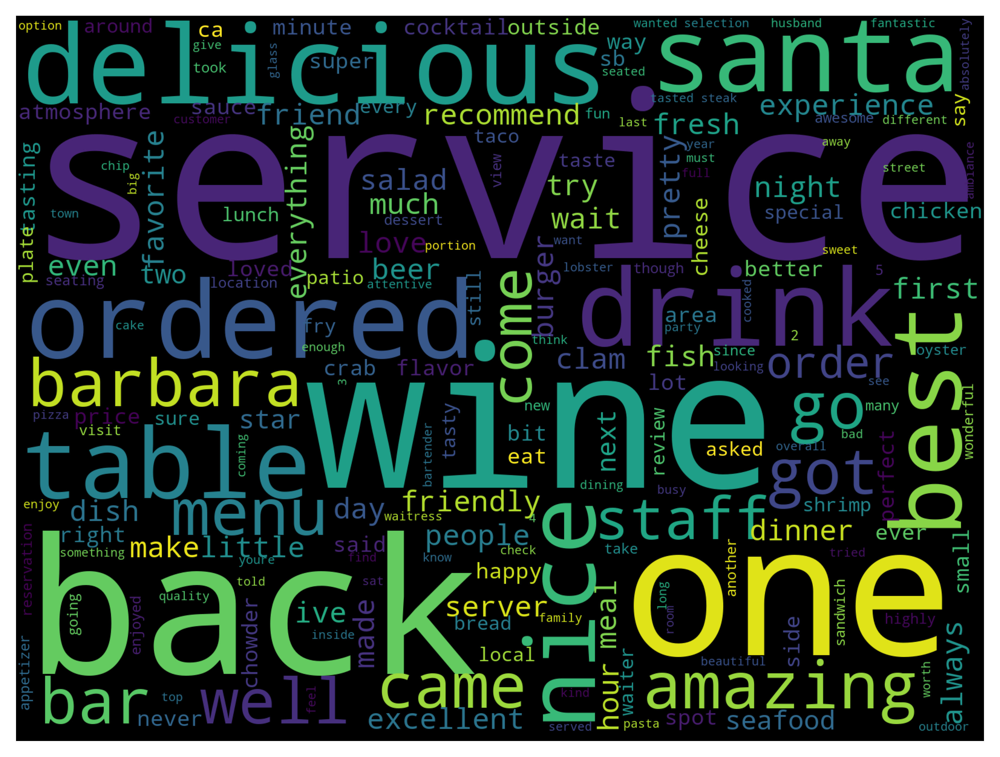

In [32]:
# Word cloud of all review words

word_cloud = WordCloud(background_color = 'Black', width = 400, height = 300, scale = 4, max_font_size = 100)
word_cloud.generate_from_frequencies(count_useful_word)

plt.figure(figsize=(10,6), dpi=600)
plt.imshow(word_cloud)
plt.axis("off")
plt.savefig('wordcloud_all.jpg')
plt.show()

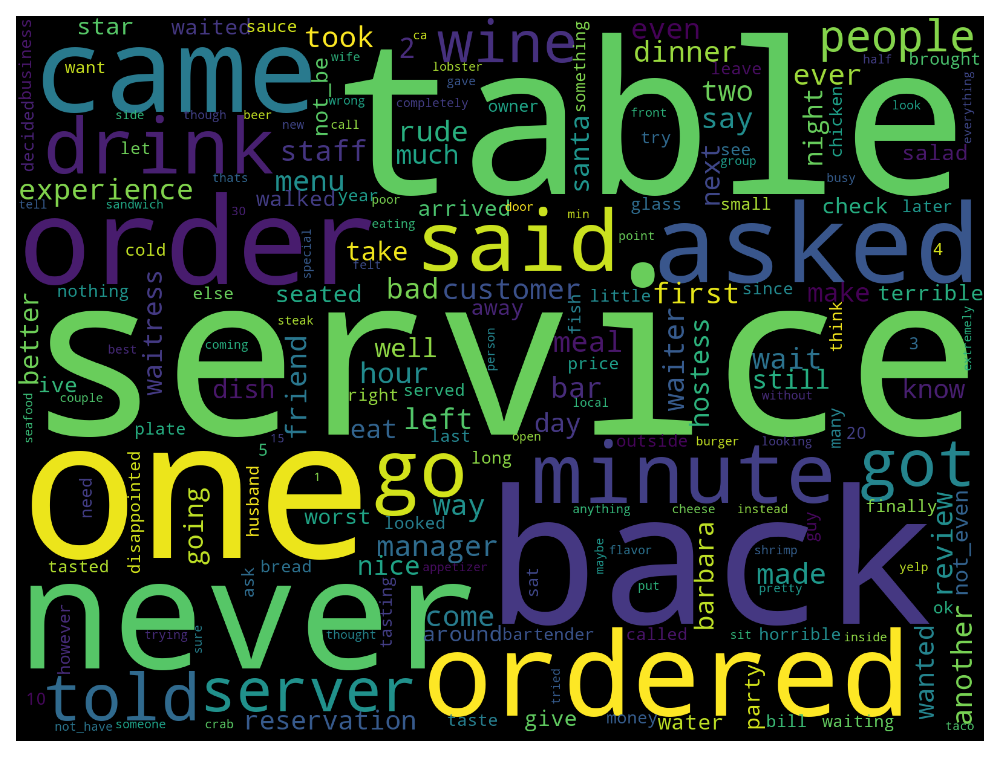

In [33]:
# Word cloud of 1-star rating

word_cloud = WordCloud(background_color = 'Black', width = 400, height = 300, scale = 4, max_font_size = 100)
word_cloud.generate_from_frequencies(count_review_1star)

plt.figure(figsize=(10,6), dpi=600)
plt.imshow(word_cloud)
plt.axis("off")
plt.savefig('wordcloud_1star.jpg')
plt.show()

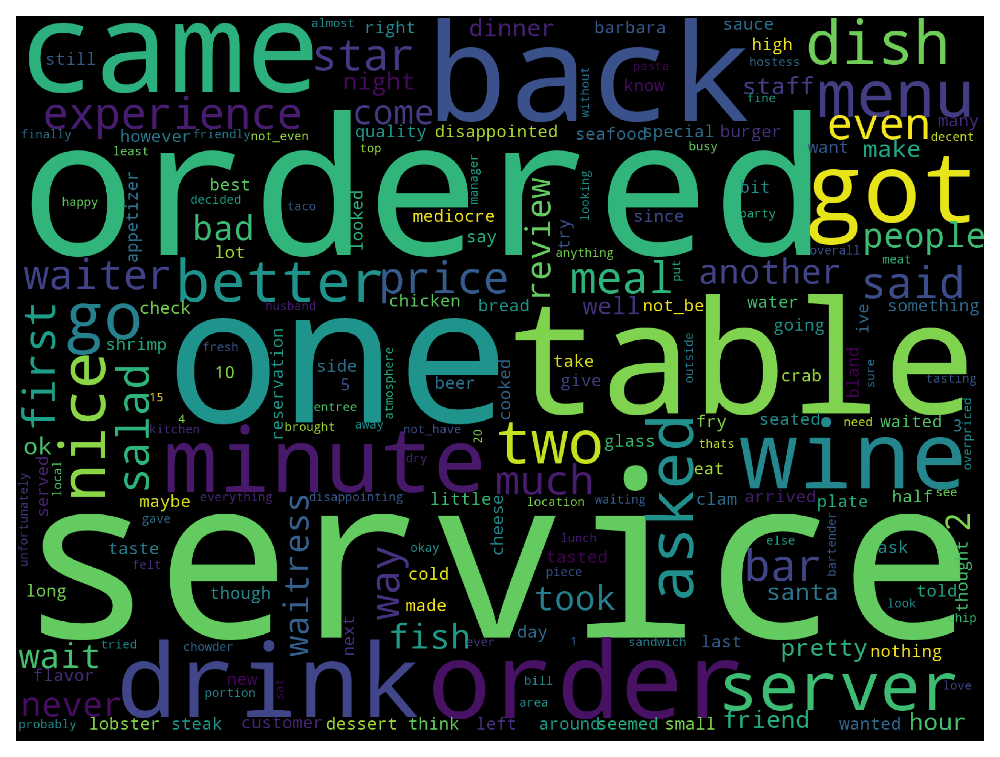

In [34]:
# Word cloud of 2-star rating

word_cloud = WordCloud(background_color = 'Black', width = 400, height = 300, scale = 4, max_font_size = 100)
word_cloud.generate_from_frequencies(count_review_2star)

plt.figure(figsize=(10,6), dpi=600)
plt.imshow(word_cloud)
plt.axis("off")
plt.savefig('wordcloud_2star.jpg')
plt.show()

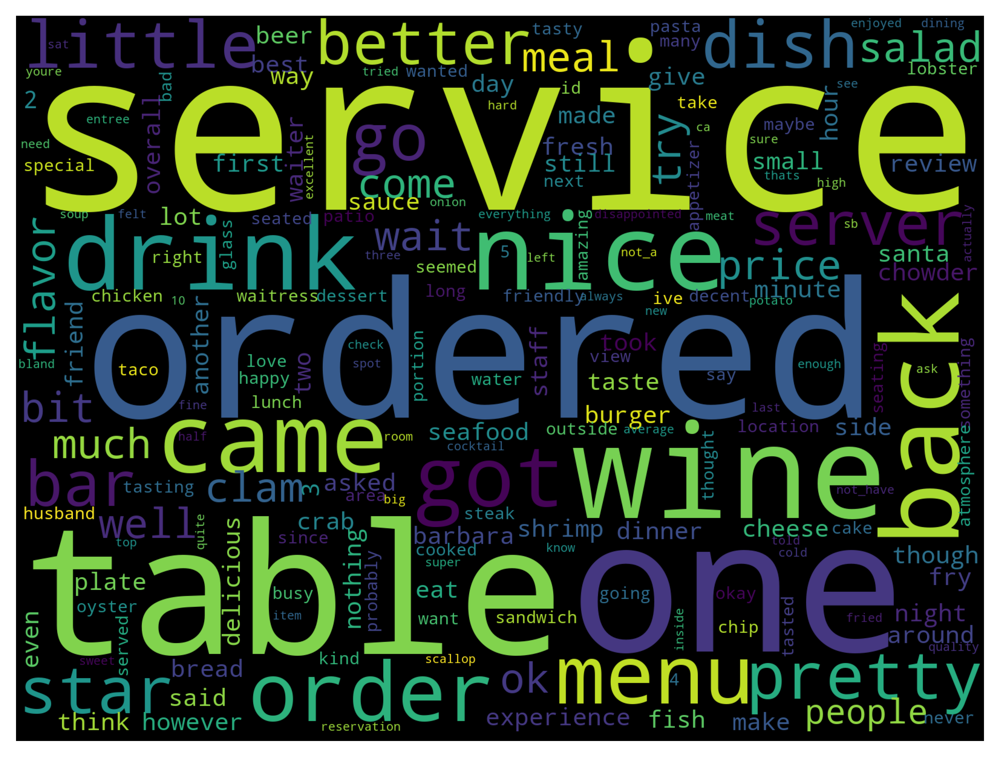

In [35]:
# Word cloud of 3-star rating

word_cloud = WordCloud(background_color = 'Black', width = 400, height = 300, scale = 4, max_font_size = 100)
word_cloud.generate_from_frequencies(count_review_3star)

plt.figure(figsize=(10,6), dpi=600)
plt.imshow(word_cloud)
plt.axis("off")
plt.savefig('wordcloud_3star.jpg')
plt.show()

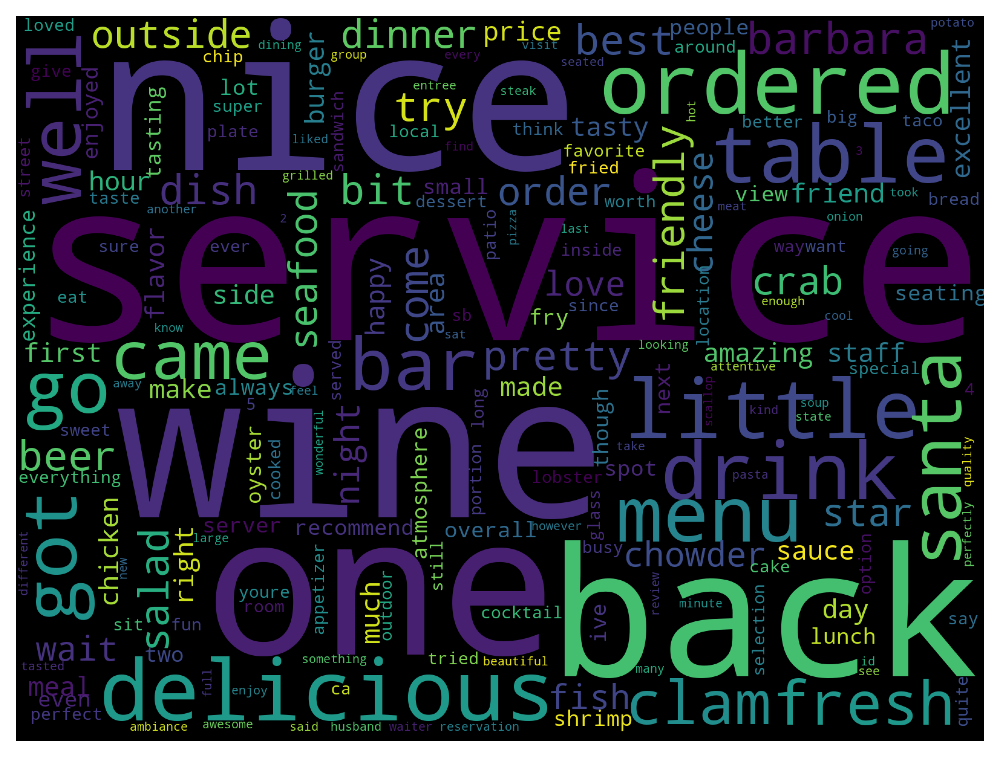

In [36]:
# Word cloud of 4-star rating

word_cloud = WordCloud(background_color = 'Black', width = 400, height = 300,scale = 4,max_font_size = 100)
word_cloud.generate_from_frequencies(count_review_4star)

plt.figure(figsize=(10,6), dpi=600)
plt.imshow(word_cloud)
plt.axis("off")
plt.savefig('wordcloud_4star.jpg')
plt.show()

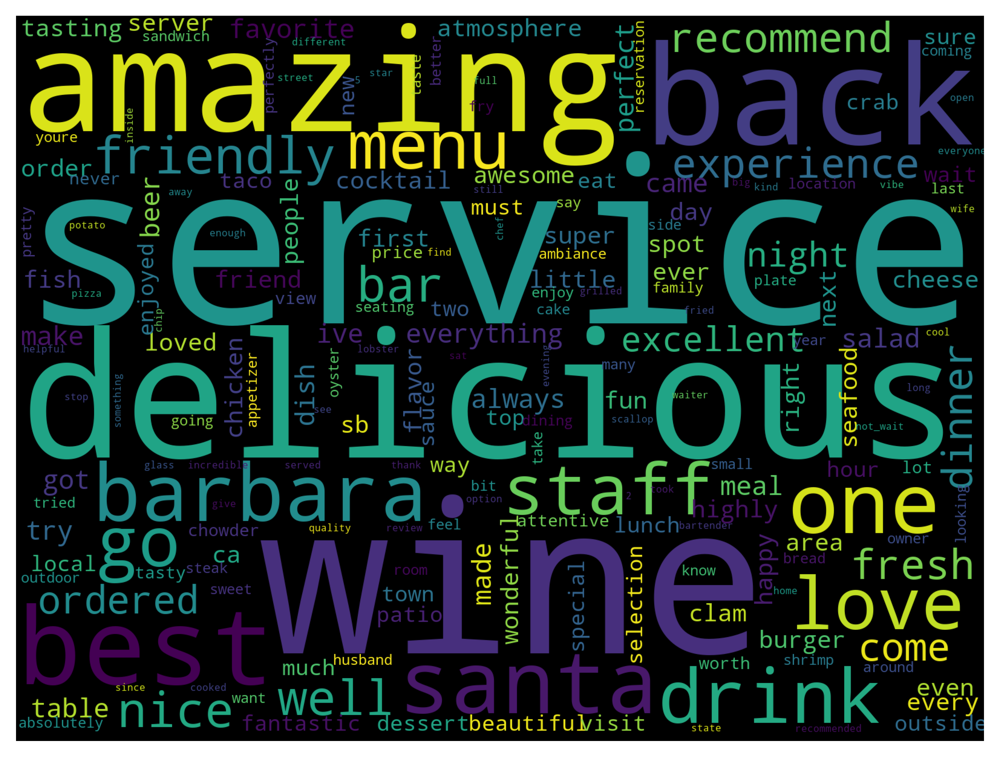

In [37]:
# Word cloud of 5-star rating

word_cloud = WordCloud(background_color = 'Black', width = 400, height = 300, scale = 4, max_font_size = 100)
word_cloud.generate_from_frequencies(count_review_5star)

plt.figure(figsize=(10,6), dpi=600)
plt.imshow(word_cloud)
plt.axis("off")
plt.savefig('wordcloud_5star.jpg')
plt.show()

In [38]:
# Histogram

review_with_rating

,rating,review_words
0,5.0,"[bit, weary, trying, shellfish, company, wharf..."
1,5.0,"[great, beautiful, spot, wine, tasting, loved,..."
2,3.0,"[tough, one, merit, wine, fairly, average, und..."
3,5.0,"[love, trying, fresh, seafood, pier, wharf, se..."
4,5.0,"[super, delish, frill, great, sea, food, sour,..."
...,...,...
44688,5.0,"[favorite, brunch, spot, santa, barbara, two, ..."
44689,5.0,"[combo, meat, plate, good, ton, food, even, ca..."
44690,2.0,"[table, got, many, weird, look, employee, coul..."
44691,5.0,"[could, give, 5, star, would, reserved, daisy,..."


In [39]:
# Define function for counting specific word

def count_word_rating(wordcheck):
    count_word_rating = {}
    for i in range(len(review_with_rating)):
        cnt = 0
        for word in review_with_rating["review_words"][i]:
            if word == wordcheck:
                cnt += 1
        count_word_rating[review_with_rating["rating"][i]] = count_word_rating.get(review_with_rating["rating"][i],0) + cnt
        
    return dict(sorted(count_word_rating.items()))

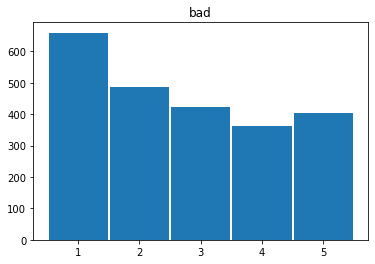

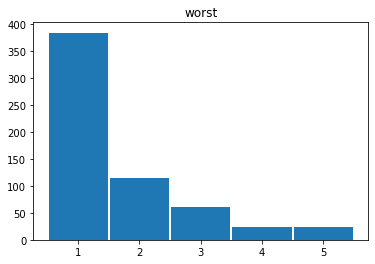

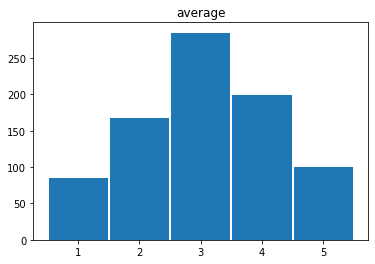

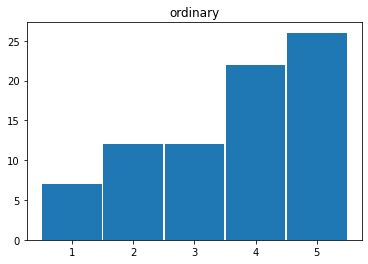

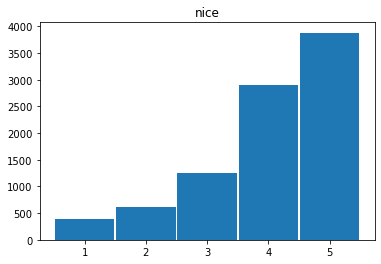

...

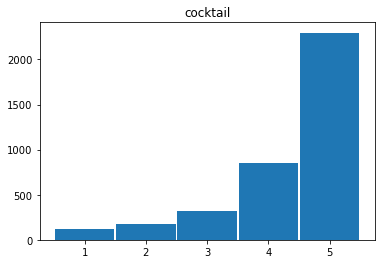

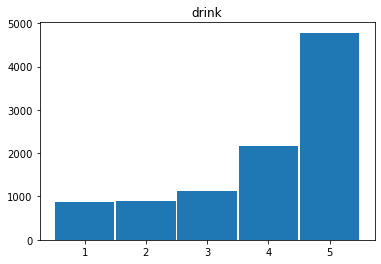

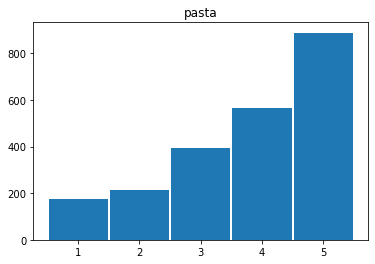

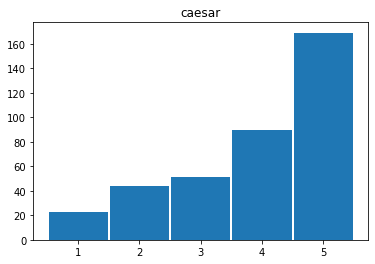

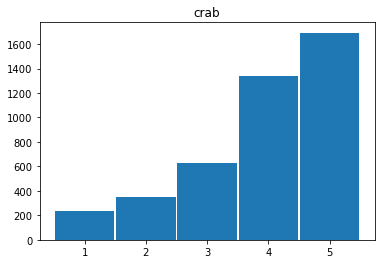

In [40]:
checklist = ["bad","worst","average","ordinary","nice","good","great","recommend"]
ambiance = ["servic","ambiance", "cheap", "expensive", "affordable", "busy", "clean", "music", "waiter","server"]
menu = ["wine","beer","cocktail","drink","pasta","caesar","crab"]
for i in checklist:
    res = count_word_rating(i)
    plt.bar(list(res.keys()), list(res.values()), width = 0.97)
    plt.title(i)
    plt.show()

for i in ambiance:
    res2 = count_word_rating(i)
    plt.bar(list(res2.keys()), list(res2.values()), width = 0.97)
    plt.title(i)
    plt.show()
    
for i in menu:
    res3 = count_word_rating(i)
    plt.bar(list(res3.keys()), list(res3.values()), width = 0.97)
    plt.title(i)
    plt.show()